In [1]:
import pandas as pd

In [2]:
raw_data = pd.read_csv('youtube_train.csv')
raw_data

,vidid,adview,views,likes,dislikes,comment,published,duration,category
0,VID_18655,40,1031602,8523,363,1095,2016-09-14,PT7M37S,F
1,VID_14135,2,1707,56,2,6,2016-10-01,PT9M30S,D
2,VID_2187,1,2023,25,0,2,2016-07-02,PT2M16S,C
3,VID_23096,6,620860,777,161,153,2016-07-27,PT4M22S,H
4,VID_10175,1,666,1,0,0,2016-06-29,PT31S,D
...,...,...,...,...,...,...,...,...,...
14994,VID_31,2,525949,1137,83,86,2015-05-18,PT6M10S,A
14995,VID_5861,1,665673,3849,156,569,2015-10-20,PT3M56S,D
14996,VID_805,4,3479,16,1,1,2013-08-23,PT3M13S,B
14997,VID_19843,1,963,0,0,0,2010-10-02,PT26S,G


In [3]:
data_train = raw_data.copy()
data_train.shape

(14999, 9)

In [4]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   vidid      14999 non-null  object
 1   adview     14999 non-null  int64 
 2   views      14999 non-null  object
 3   likes      14999 non-null  object
 4   dislikes   14999 non-null  object
 5   comment    14999 non-null  object
 6   published  14999 non-null  object
 7   duration   14999 non-null  object
 8   category   14999 non-null  object
dtypes: int64(1), object(8)
memory usage: 1.0+ MB


In [5]:
sorted(data_train['category'].unique())

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']

In [6]:
category = {'A':1, 'B':2, 'C':3, 'D':4, 'E':5, 'F':6, 'G':7, 'H':8}
data_train['category'] = data_train['category'].map(category)

In [7]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [8]:
display(data_train)

,vidid,adview,views,likes,dislikes,comment,published,duration,category
0,VID_18655,40,1031602,8523,363,1095,2016-09-14,PT7M37S,6
1,VID_14135,2,1707,56,2,6,2016-10-01,PT9M30S,4
2,VID_2187,1,2023,25,0,2,2016-07-02,PT2M16S,3
3,VID_23096,6,620860,777,161,153,2016-07-27,PT4M22S,8
4,VID_10175,1,666,1,0,0,2016-06-29,PT31S,4
5,VID_10756,4,78,0,0,0,2016-05-09,PT15S,4
6,VID_9782,40621,43118,15,1,0,2015-08-21,PT3M20S,4
7,VID_16452,1,14205,55,16,1,2016-08-01,PT58S,5
8,VID_18486,1,526015,3064,211,2582,2015-11-06,PT27M50S,6
9,VID_681,1,406992,3831,310,7839,2016-10-03,PT11M19S,2


In [9]:
data_train = data_train[data_train.views!='F']
data_train = data_train[data_train.likes!='F']
data_train = data_train[data_train.dislikes!='F']
data_train = data_train[data_train.comment!='F']

In [10]:
data_train['views'] = pd.to_numeric(data_train['views'])
data_train['likes'] = pd.to_numeric(data_train['likes'])
data_train['dislikes'] = pd.to_numeric(data_train['dislikes'])
data_train['comment'] = pd.to_numeric(data_train['comment'])
data_train['adview'] = pd.to_numeric(data_train['adview'])

In [11]:
column_vidid = data_train['vidid']

In [12]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14637 entries, 0 to 14998
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   vidid      14637 non-null  object
 1   adview     14637 non-null  int64 
 2   views      14637 non-null  int64 
 3   likes      14637 non-null  int64 
 4   dislikes   14637 non-null  int64 
 5   comment    14637 non-null  int64 
 6   published  14637 non-null  object
 7   duration   14637 non-null  object
 8   category   14637 non-null  int64 
dtypes: int64(6), object(3)
memory usage: 1.1+ MB


In [13]:
data_train['published'] = pd.to_datetime(data_train['published'], format='%Y-%m-%d')

In [14]:
data_train['weekday'] = data_train['published'].dt.weekday

In [15]:
data_train['weekday'] = data_train['published'].dt.weekday
data_train['month'] = data_train['published'].dt.month
data_train['day'] = data_train['published'].dt.day
data_train['year'] = data_train['published'].dt.year

In [16]:
data_train

,vidid,adview,views,likes,dislikes,comment,published,duration,category,weekday,month,day,year
0,VID_18655,40,1031602,8523,363,1095,2016-09-14,PT7M37S,6,2,9,14,2016
1,VID_14135,2,1707,56,2,6,2016-10-01,PT9M30S,4,5,10,1,2016
2,VID_2187,1,2023,25,0,2,2016-07-02,PT2M16S,3,5,7,2,2016
3,VID_23096,6,620860,777,161,153,2016-07-27,PT4M22S,8,2,7,27,2016
4,VID_10175,1,666,1,0,0,2016-06-29,PT31S,4,2,6,29,2016
5,VID_10756,4,78,0,0,0,2016-05-09,PT15S,4,0,5,9,2016
6,VID_9782,40621,43118,15,1,0,2015-08-21,PT3M20S,4,4,8,21,2015
7,VID_16452,1,14205,55,16,1,2016-08-01,PT58S,5,0,8,1,2016
8,VID_18486,1,526015,3064,211,2582,2015-11-06,PT27M50S,6,4,11,6,2015
9,VID_681,1,406992,3831,310,7839,2016-10-03,PT11M19S,2,0,10,3,2016


In [17]:
# checkpoint
data_train_date = data_train.copy()

In [18]:
import datetime
import time

In [19]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt

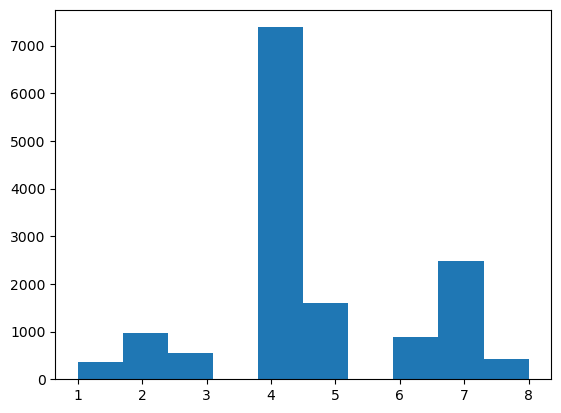

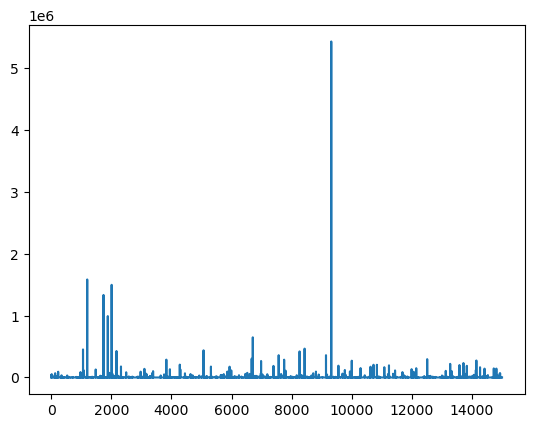

In [20]:
plt.hist(data_train_date["category"])
plt.show()
plt.plot(data_train_date["adview"])
plt.show()

In [21]:
data_train_date = data_train_date[data_train_date["adview"] <2000000]

In [22]:
data_train_date.shape

(14636, 13)

In [23]:
data_heat = data_train_date.drop(columns=['vidid','duration','published'])

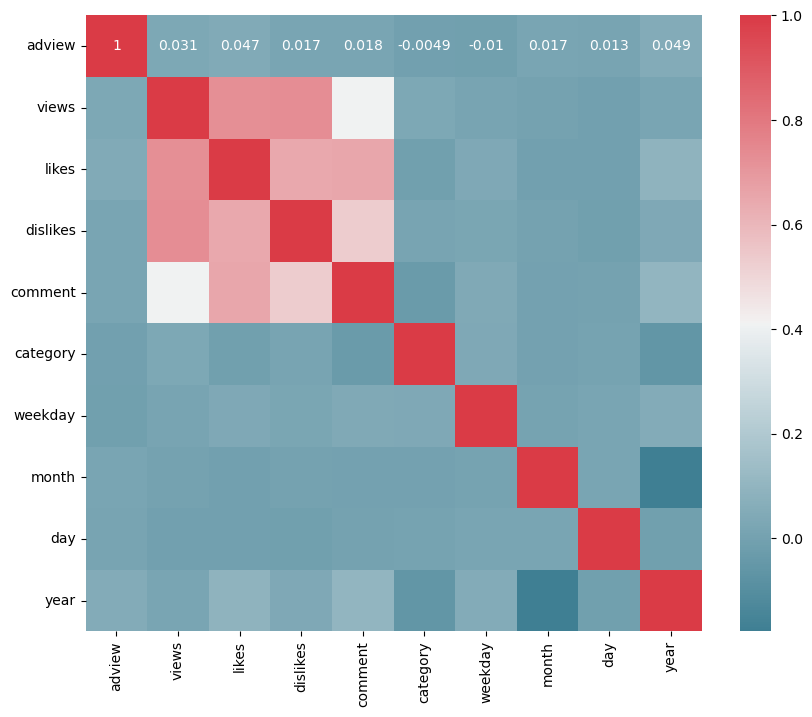

In [24]:
# to check correlation 
import seaborn as sns
import numpy as np
f, ax = plt.subplots(figsize=(10, 8))
corr = data_heat.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=bool), cmap=sns.diverging_palette(220, 10, as_cmap=True), square=True,
            ax=ax,annot=True)
plt.show()

In [25]:
def checki(x):
    y = x[2:]
    h = ''
    m = ''
    s = ''
    mm = ''
    P = ['H','M','S']
    for i in y:
        if i not in P:
            mm+=i
        else:
            if(i=='H'):
                h = mm
                mm = ''
            elif(i == 'M'):
                m = mm
                mm = ''
            else:
                s = mm
                mm = ''
    if(h==''):
        h = '00'
    if(m == ''):
        m = '00'
    if(s==''):
        s='00'
    bp = h+':'+m+':'+s
    return bp
mp = data_train_date['duration']
time = mp.apply(checki)

def func_sec(time_string):
    h, m, s = time_string.split(':')
    return int(h) * 3600 + int(m) * 60 + int(s)

time1=time.apply(func_sec)
data_train_date['duration']=time1

### Checkpoint

In [26]:
data_train_final = data_train_date.copy()

In [27]:
Y_train = pd.DataFrame(data = data_train_final.iloc[:, 1].values, columns = ['target'])
data_train_final=data_train_final.drop(['adview'],axis=1)
data_train_final=data_train_final.drop(['vidid'],axis=1)
data_train_final=data_train_final.drop(['published'],axis=1)
data_train_final.head()

,views,likes,dislikes,comment,duration,category,weekday,month,day,year
0,1031602,8523,363,1095,457,6,2,9,14,2016
1,1707,56,2,6,570,4,5,10,1,2016
2,2023,25,0,2,136,3,5,7,2,2016
3,620860,777,161,153,262,8,2,7,27,2016
4,666,1,0,0,31,4,2,6,29,2016


In [28]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data_train_final, Y_train, test_size=0.2, random_state=42)

In [29]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.fit_transform(X_test)

In [30]:
# Evaluation Metrics
from sklearn import metrics
def print_error(X_test, y_test, model_name):
    prediction = model_name.predict(X_test)
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, prediction))
    print('Mean Squared Error:', metrics.mean_squared_error(y_test, prediction))
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

In [31]:
# Linear Regression
from sklearn import linear_model
linear_regression = linear_model.LinearRegression()
linear_regression.fit(X_train, y_train)
print_error(X_test,y_test, linear_regression)

Mean Absolute Error: 3715.4642619959363
Mean Squared Error: 835164722.5069855
Root Mean Squared Error: 28899.216641753206


In [32]:
# Support Vector Regressor
from sklearn.svm import SVR
supportvector_regressor = SVR()
supportvector_regressor.fit(X_train,y_train)
print_error(X_test,y_test, linear_regression)

D:\Anaconda\Anacondafiles\Lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Mean Absolute Error: 3715.4642619959363
Mean Squared Error: 835164722.5069855
Root Mean Squared Error: 28899.216641753206


In [33]:
# Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
decision_tree = DecisionTreeRegressor()
decision_tree.fit(X_train, y_train)
print_error(X_test,y_test, decision_tree)

Mean Absolute Error: 2686.95662568306
Mean Squared Error: 1639210788.040642
Root Mean Squared Error: 40487.16818994188


In [35]:
# Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
n_estimators = 200
max_depth = 25
min_samples_split=15
min_samples_leaf=2
random_forest = RandomForestRegressor(n_estimators = n_estimators, max_depth = max_depth, min_samples_split=min_samples_split)
random_forest.fit(X_train,y_train)
print_error(X_test,y_test, random_forest)

C:\Users\sahil\AppData\Local\Temp\ipykernel_3032\3179977126.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  random_forest.fit(X_train,y_train)


Mean Absolute Error: 3395.611783334713
Mean Squared Error: 774420495.5423394
Root Mean Squared Error: 27828.411660429694


In [40]:
np.savez('test_train.npz', X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test)